# pyannote2.0 - Trained pipeline_embed online notebook 

In [1]:
import os
os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"] = "3"
# CUDA_VISIBLE_DEVICES options = 0/1/2/3. Make sure to restart
!echo $CUDA_VISIBLE_DEVICES
!nvidia-smi


3
Sun Jul 31 15:55:18 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 510.47.03    Driver Version: 510.47.03    CUDA Version: 11.6     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Quadro RTX 6000     Off  | 00000000:19:00.0 Off |                  Off |
| 33%   38C    P8    30W / 260W |  24214MiB / 24576MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
|   1  Quadro RTX 6000     Off  | 00000000:1A:00.0 Off |                  Off |
| 34% 

In [2]:
# !pip install wget
# !pip install memory_profiler
# !pip install holoviews 
# !pip install noisereduce
import os
import wget
from zipfile import ZipFile
import warnings
from IPython.display import Audio, display
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import librosa

from pyannote.database.util import load_rttm
from pyannote.core import Segment, notebook
from pyannote.audio import Pipeline
from pyannote.metrics.diarization import DiarizationErrorRate

%load_ext memory_profiler

warnings.filterwarnings(action='once')

/root/anaconda3/envs/pyannote/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
# !pip install https://github.com/pyannote/pyannote-audio/archive/develop.zip
# !wget -q http://groups.inf.ed.ac.uk/ami/AMICorpusMirror/amicorpus/ES2014a/audio/ES2014a.Mix-Headset.wav
# !wget -q https://raw.githubusercontent.com/pyannote/pyannote-audio/master/tutorials/data_preparation/AMI/MixHeadset.test.rttm

# Paper at https://arxiv.org/pdf/1911.01255.pdf
# manual annotations (a.k.a groundtruth) in rttm file

ROOT = os.getcwd()
data_dir = os.path.join(ROOT,'sample_audio_rttm')

if not os.path.exists(data_dir):
    # download data files if not present
    os.makedirs(data_dir, exist_ok=True)
    print(f"Downloading 5 wavs, 5 rttms into (~121mb): {data_dir}")
    # please copy paste in website to update link from browser
    wget.download('http://download1326.mediafire.com/ogqpruij2v6g/0s2w0o8ueda1ret/sample_audio_rttm.zip', ROOT)
    print("Extracting...")
    with ZipFile(ROOT+'/sample_audio_rttm.zip', 'r') as zip_ref:
        zip_ref.extractall(data_dir)

        
# an4_diarize_test.wav, 00:00:05.20    [5 s    ]
# mbzht.wav, 00:02:10.82               [2 min  ]
# jttar.wav, 00:10:43.58               [10 min ]
# IS1009c.Mix-Headset.wav, 00:30:20.83 [30 min ]
# EN2002c.Mix-Headset.wav, 00:49:32.26 [50 min ]

URI_LIST = ['an4', 'mbzht', 'jttar', 'IS1009c.Mix-Headset', 'EN2002c.Mix-Headset']
AUDIO_LIST = ['an4_diarize_test.wav', 'mbzht.wav', 'jttar.wav', 'IS1009c.Mix-Headset.wav', 'EN2002c.Mix-Headset.wav']
RTTM_LIST = ['an4_diarize_test.rttm', 'mbzht.rttm', 'jttar.rttm', 'IS1009c.Mix-Headset.rttm', 'EN2002c.Mix-Headset.rttm']

"""
ONLY NEED TO CHANGE idx = 0,1,2,3,4
"""
idx = 0


audio_uri = URI_LIST[idx]
audio_file = AUDIO_LIST[idx]
rttm_file =  RTTM_LIST[idx] #  loads a dictionary of label:rttm
audio_file = os.path.join(data_dir, audio_file)
rttm_file = os.path.join(data_dir, rttm_file)

    
print(f"[{os.getpid()}] Loaded audio: {audio_file}\n")
!cat {rttm_file}

[49987] Loaded audio: /home/DATA/amit_kesari/SD1/pyannote-v2/sample_audio_rttm/an4_diarize_test.wav

SPEAKER an4 1 0.298981 2.47133 <NA> <NA> A <NA>
SPEAKER an4 1 3.163901 1.98311 <NA> <NA> B <NA>


In [4]:
# # to clean audio noises - increase DER
# from scipy.io import wavfile
# import noisereduce as nr
# # load data
# sr, signal = wavfile.read(audio_file)
# # perform noise reduction
# reduced_noise = nr.reduce_noise(y=signal, sr=sr, use_tqdm=True)
# wavfile.write("mywav_reduced_noise.wav", sr, reduced_noise)
# audio_file="mywav_reduced_noise.wav"

In [5]:
# load audio waveform
# display(Audio(audio_file, rate=16000, autoplay=True))

from scipy.signal import spectrogram
import holoviews as hv 
import panel as pn
from scipy.io import wavfile

def sync_audio_spec(audio_file, show_panel=True):
    """
    Sync both audio and spectrogram
    Set show_panel=False incase of high memory usage and hanging
    """
    hv.extension("bokeh", logo=False)

    e = 10**-8 # for non-zero

    sr, wav_data = wavfile.read(audio_file)
    # audio is of one channel right now
    # audio_data = wav_data[:,0] # first channel
    audio_data = wav_data 
    f, t, sxx = spectrogram(audio_data, sr)
    # print(f, t, sxx )
    
    x, y = np.arange(len(audio_data)), audio_data
    line_plot = hv.Curve((x/sr, y/sr),
                         ["Time (s)", "Signal Strength (A)"]).opts(width=900)

    spec_gram = hv.Image((t, f, 10*np.log10(sxx+e)), 
                         ["Time (s)", "Frequency (hz)"]).opts(width=900, cmap='Plasma', colorbar=True)
    audio = pn.pane.Audio(wav_data, sample_rate=sr, name='Audio', throttle=500)

    def update_playhead(x,y,t):
        """
        playhead to update when the time changes while you're playing it.
        links a stream with a callback function, through dmap_time.
        """
        if x is None:
            return hv.VLine(t).opts(color='#f0f0f0')
        else:
            audio.time = x
            return hv.VLine(x).opts(color='#f0f0f0')

    # to click the plot and update the playhead as well
    tap_stream = hv.streams.SingleTap(transient=True)
    time_play_stream = hv.streams.Params(parameters=[audio.param.time], rename={'time': 't'})
    dmap_time = hv.DynamicMap(update_playhead, streams=[time_play_stream, tap_stream])

    # * operator to overlay the image with the returned Vline playhead
    # pn.Column displays audio on top of spectrogram
    out = pn.Column( audio, 
                   (spec_gram * dmap_time),
                   (line_plot * dmap_time),
                   )
    if show_panel:
        display(out)
    
    
# Show and sync both audio and spectrogram
sync_audio_spec(audio_file, show_panel=True)


Column
    [0] Audio(ndarray, sample_rate=16000, throttle=500)
    [1] HoloViews(DynamicMap)
    [2] HoloViews(DynamicMap)

/root/anaconda3/envs/pyannote/lib/python3.8/site-packages/audioread/__init__.py:86: ResourceWarning: unclosed file <_io.BufferedReader name=65>
  if ffdec.available():
/root/anaconda3/envs/pyannote/lib/python3.8/site-packages/audioread/__init__.py:86: ResourceWarning: unclosed file <_io.BufferedReader name=67>
  if ffdec.available():


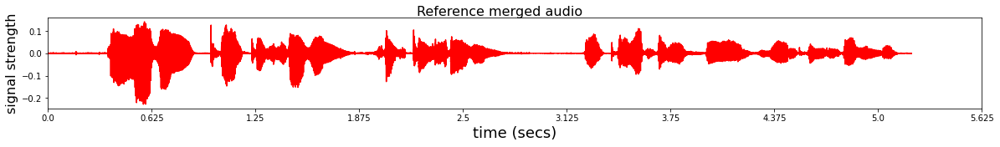

In [6]:
# import torchaudio
# # corrects the sample rate and channels of audio
# SAMPLE_RATE = 16000

# waveform, sr = torchaudio.load(audio_file)
# metadata = torchaudio.info(audio_file)

# print(metadata)

# waveform = waveform.mean(dim=0) # if there are multiple channels, average them to single channel
# waveform = waveform.reshape(1, waveform.shape[0])
# if sr != SAMPLE_RATE:
#     resampler = torchaudio.transforms.Resample(sr, SAMPLE_RATE)
#     waveform_resampled = resampler(waveform)
#     waveform = waveform_resampled
# print("waveform, sr", waveform, sr)

# torchaudio.save(audio_file, waveform, SAMPLE_RATE, bits_per_sample=16, encoding="PCM_S")

# metadata = torchaudio.info(audio_file)
# print(metadata)
# ## Audio(audio_file)

# # Plot
sr = 16000
signal, sr = librosa.load(audio_file, sr=sr) 

# plot and listen to the audio and visualize the tracks
fig,ax = plt.subplots(1,1)
fig.set_figwidth(20)
fig.set_figheight(2)
plt.plot(np.arange(len(signal)),signal,'red')
fig.suptitle('Reference merged audio', fontsize=16)
plt.xlabel('time (secs)', fontsize=18)
ax.margins(x=0)
plt.ylabel('signal strength', fontsize=16);
a,_ = plt.xticks();plt.xticks(a,a/sr);
plt.show()



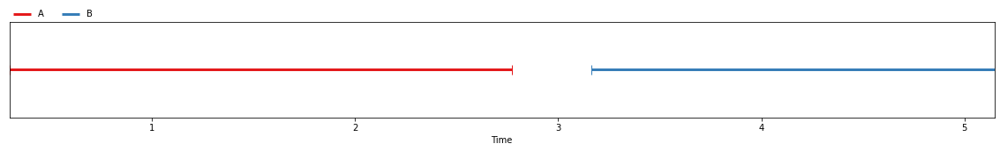

In [7]:
# load groundtruth

groundtruth = load_rttm(rttm_file) # this is a dict for groundtruth rttm db
groundtruth = groundtruth[audio_uri] # get groundtruth of DEMO_FILE

# visualize groundtruth
groundtruth
# This nice visualization is by pyannote.core and basically indicates when each speaker speaks.
# SPEAKER {file_name} 1 {start_time} {duration} <NA> <NA> {speaker_name} <NA> <NA>

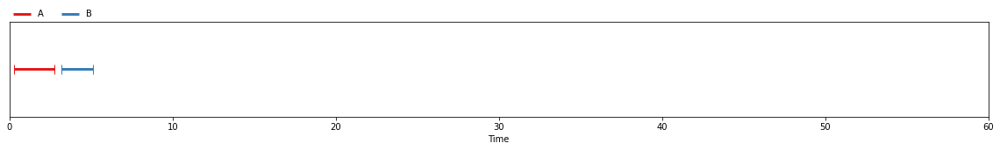

In [8]:
# make notebook visualization zoom on 0s < t < 60s time range
EXCERPT = Segment(0,60)
notebook.crop = EXCERPT

# visualize excerpt from groundtruth
groundtruth

In [9]:
# loading the SD model from huggingface
# %memit 
pipeline = Pipeline.from_pretrained("pyannote/speaker-diarization")

/root/anaconda3/envs/pyannote/lib/python3.8/site-packages/huggingface_hub/file_download.py:560: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(
/root/anaconda3/envs/pyannote/lib/python3.8/site-packages/huggingface_hub/file_download.py:560: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(
/root/anaconda3/envs/pyannote/lib/python3.8/site-packages/pyannote/audio/core/model.py:421: UserWarning: Model was trained with pyannote.audio 0.0.1, yours is 2.0.1. Bad things will probably happen unless you update pyannote.audio to 0.x.
  warnings.warn(


peak memory: 3000.45 MiB, increment: 2516.04 MiB


In [10]:
# %%timeit
# timeit wont store the vairables, remove it

# apply pretrained pipeline
diarization = pipeline(audio_file)


Fitting a model with 771 free scalar parameters with only 384 data points will result in a degenerate solution.
Fitting a model with 771 free scalar parameters with only 384 data points will result in a degenerate solution.
Fitting a model with 771 free scalar parameters with only 384 data points will result in a degenerate solution.
Fitting a model with 771 free scalar parameters with only 384 data points will result in a degenerate solution.
Fitting a model with 771 free scalar parameters with only 384 data points will result in a degenerate solution.
Fitting a model with 771 free scalar parameters with only 384 data points will result in a degenerate solution.
Fitting a model with 771 free scalar parameters with only 384 data points will result in a degenerate solution.
Fitting a model with 771 free scalar parameters with only 384 data points will result in a degenerate solution.
Fitting a model with 771 free scalar parameters with only 384 data points will result in a degenerate so

852 ms ± 43.9 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


Fitting a model with 771 free scalar parameters with only 384 data points will result in a degenerate solution.
Fitting a model with 771 free scalar parameters with only 384 data points will result in a degenerate solution.


diarization error rate 2 = 9.5%


/root/anaconda3/envs/pyannote/lib/python3.8/site-packages/pyannote/metrics/utils.py:200: UserWarning: 'uem' was approximated by the union of 'reference' and 'hypothesis' extents.
  warnings.warn(


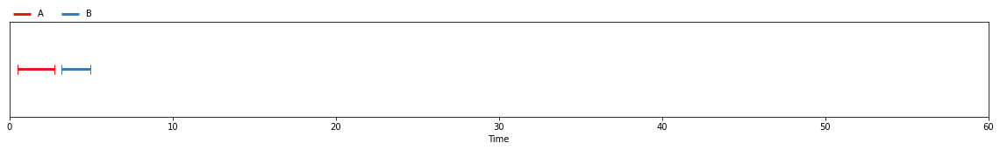

In [11]:
# DER by finding optimal one-to-one mapping between groundtruth and hypothesized speakers.
diarization = pipeline(audio_file)

metric = DiarizationErrorRate()
der = metric(groundtruth, diarization)
print(f'diarization error rate 2 = {100 * der:.1f}%')


mapping = metric.optimal_mapping(groundtruth, diarization)
diarization = diarization.rename_labels(mapping=mapping)
diarization

In [12]:
# write to pred_rttms folder
out_dir = os.path.join(data_dir,'pred_rttms')
os.makedirs(out_dir, exist_ok=True)

out_rttm_path = os.path.join(out_dir, audio_uri+'.rttm')
with open(out_rttm_path, 'w') as file:
    diarization.write_rttm(file)
print(f"written predicted result to : {out_rttm_path}")

written predicted result to : /home/DATA/amit_kesari/SD1/pyannote-v2/sample_audio_rttm/pred_rttms/an4.rttm


In [13]:
# Overlap detection in audio
pipeline = Pipeline.from_pretrained("pyannote/overlapped-speech-detection")
overlap_output = pipeline(audio_file).get_timeline()


/root/anaconda3/envs/pyannote/lib/python3.8/site-packages/huggingface_hub/file_download.py:560: FutureWarning: `cached_download` is the legacy way to download files from the HF hub, please consider upgrading to `hf_hub_download`
  warnings.warn(
/root/anaconda3/envs/pyannote/lib/python3.8/site-packages/pyannote/audio/core/model.py:421: UserWarning: Model was trained with pyannote.audio 0.0.1, yours is 2.0.1. Bad things will probably happen unless you update pyannote.audio to 0.x.
  warnings.warn(


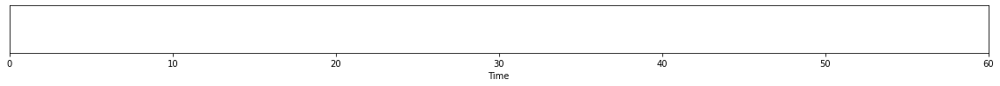

In [14]:
overlap_output

## visualisation of speakers second by second

In [15]:
import math
import time

def secondwise_speaker_iter(annotation):
    total_time = 0   
    timelines = annotation.get_timeline()

    speaker_dict = {}
    # print the result
    for turn, _, speaker in annotation.itertracks(yield_label=True):
#         print(f"start={turn.start:.1f}s stop={turn.end:.1f}s speaker_{speaker}")
        total_time = max(total_time, math.ceil(turn.end))
        
        for t in range(math.ceil(turn.start), math.ceil(turn.end)):
            if t not in speaker_dict.keys():
                speaker_dict[t] = [speaker]
            else:
                speaker_dict[t].append(speaker)
    return speaker_dict, total_time

def print_secondwise_speaker(annotation, time_step=1):
    print("Starting with delay of 1 s (Click on Audio above)...")
    print()
    
    time.sleep(time_step)
    
    speaker_dict, total_time = secondwise_speaker_iter(annotation)
    elapsed = 0
    print_list = []
    while(elapsed < total_time):
        time.sleep(time_step)
        elapsed += time_step
        if elapsed in speaker_dict.keys():
            print_list.append(speaker_dict[elapsed])
            print(f"\rAt: {elapsed:03d}s Speaker: {print_list[-1]}\t\t\t\t\t\t\t\t\t\t\t", end="")


In [16]:
# load audio waveform
Audio(audio_file, rate=16000)

In [17]:
print_secondwise_speaker(diarization)

Starting with delay of 1 s (Click on Audio above)...

At: 004s Speaker: ['B']											

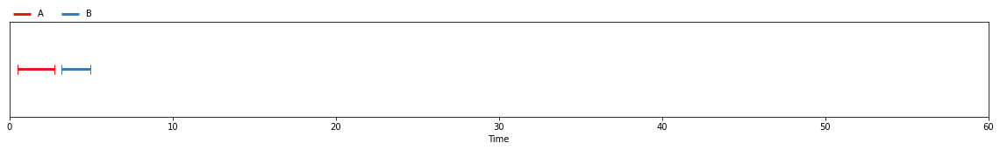

In [18]:
diarization

## visualise speaker embeddings

In [19]:
import numpy as np
import matplotlib.pyplot as plt
from pyannote.audio import Inference
from pyannote.core import Segment
inference = Inference("pyannote/embedding", window="whole", device="cuda")

import torch
from pyannote.audio.pipelines.speaker_verification import PretrainedSpeakerEmbedding
from pyannote.audio import Audio
from pyannote.core import Segment
audio = Audio(sample_rate=16000, mono=True)


def get_speakers_embedding(annotation, audio_file, plot=True, embed_model="speechbrain/spkrec-ecapa-voxceleb"):
    """
    get single segments for each speaker, and return their embeddings
    `embedding` is (1 x D) numpy array extracted from the file excerpt.
    
    embed_model = ["speechbrain/spkrec-ecapa-voxceleb", "pyannote/embedding"]

    """
    model = PretrainedSpeakerEmbedding(
        embed_model,
        device=torch.device("cuda")
    )
    
    speaker_segments = {}
    speaker_embeds = {}

    for turn, _, speaker in annotation.itertracks(yield_label=True):
        # print(f"start={turn.start:.1f}s stop={turn.end:.1f}s speaker={speaker}")
        if not speaker in speaker_segments.keys():
            speaker_segments[speaker] = (turn.start, turn.end)

    
    for speaker, turn in speaker_segments.items():
        # extract embedding for a speaker speaking between turns
        excerpt = Segment(turn[0], turn[1])
        excerpt_waveform, excerpt_sr = audio.crop(audio_file, excerpt)
        embed = model(excerpt_waveform[None])
        speaker_embeds[speaker] = embed[0] #TODO: explore it to be 2d by running on complete audio
        
        
    # Speaker spk00 embed shape:(512,)
    # print("ss",speaker_segments)
    # print("se", speaker_embeds)
    if plot == True:
        plt.rcParams["figure.figsize"] = [10, 4]
        plt.rcParams["figure.autolayout"] = True
        
        np.random.seed(42)
        x = np.arange(0,len(speaker_embeds[speaker]))
        plt.title(f"Speaker Embeddings Graph: {embed_model}")

        
        for speaker, embed in speaker_embeds.items():
            plt.plot(x, embed, color=np.random.rand(3,))
        plt.legend(speaker_embeds.keys())
        plt.show()
        
    return speaker_embeds   



/root/anaconda3/envs/pyannote/lib/python3.8/site-packages/pytorch_lightning/core/saving.py:217: UserWarning: Found keys that are not in the model state dict but in the checkpoint: ['loss_func.W']
  rank_zero_warn(


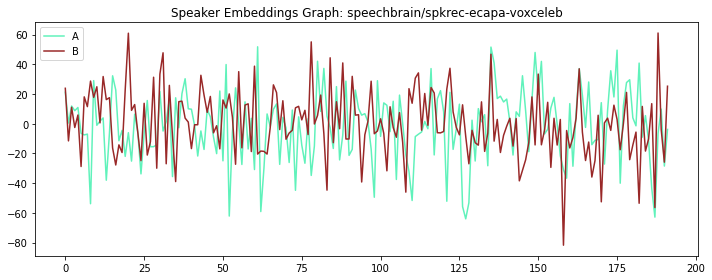

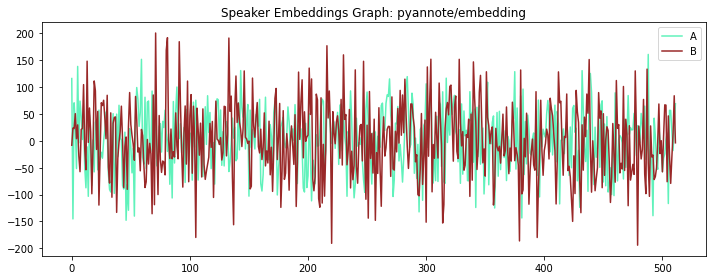

Speakers: ['A', 'B']


array([[1.01771748]])

In [20]:
        
speaker_embeds = get_speakers_embedding(annotation = diarization, audio_file=audio_file,plot=True)
speaker_embeds1 = get_speakers_embedding(annotation = diarization, audio_file=audio_file, plot=True, embed_model="pyannote/embedding")


# compare embeddings using "cosine" distance
from scipy.spatial.distance import cdist
spk=list(speaker_embeds.keys())
print("Speakers:",spk)
distance = cdist([speaker_embeds[spk[0]]], [speaker_embeds[spk[1]]], metric="cosine")
distance

In [21]:
stoppp

NameError: name 'stoppp' is not defined

## Data preparation and pipeline train

In [ ]:
# Setup from BUT https://github.com/pyannote/AMI-diarization-setup
# tell pyannote.database where to find partition, reference, and wav files
import os
BASE_DIR = os.getcwd()
env_path = os.path.join(BASE_DIR, '../../AMI-diarization-setup/pyannote/database.yml')
os.environ["PYANNOTE_DATABASE_CONFIG"] = env_path
print(f'PYANNOTE_DATABASE_CONFIG = {os.environ["PYANNOTE_DATABASE_CONFIG"]}')


# used to automatically find paths to wav files
from pyannote.database import FileFinder
preprocessors = {'audio': FileFinder()}

# initialize 'only_words' experimental protocol
from pyannote.database import get_protocol
ami = get_protocol('AMI.SpeakerDiarization.only_words', preprocessors=preprocessors)

# iterate over the training set
for file in ami.train():
    # IS1000a, [ 00:00:37.250 -->  00:00:38.010] 0 spk1, path
    meeting = file['uri']
    reference = file['annotation']
    path = file['audio']

# iterate over the development set
for file in ami.development():
    pass

# iterate over the test set
for file in ami.test():
    pass

# initialize 'word_and_vocalsounds' experimental protocol
word_and_vocalsounds = get_protocol('AMI.SpeakerDiarization.word_and_vocalsounds')


# !nvidia-smi

# pyannote.database protocols usually define:
# a training set: for training_file in protocol.train(): ...,
# a validation set: for validation_file in protocol.development(): ...
# an evaluation set for evaluation_file in protocol.test(): ...
# Let's listen to one minute of the first training file...

# first_training_file = next(ami.train())
# reference = first_training_file["annotation"]
# from pyannote.audio.utils.preview import listen
# from pyannote.core import Segment
# one_minute = Segment(240, 300)
# listen(first_training_file, one_minute)

In [ ]:
# from pyannote.audio import Pipeline
# pipeline2 = Pipeline.from_pretrained("pyannote/speaker-diarization")
# diarization2 = pipeline2(DEMO_FILE)

from pyannote.pipeline import Optimizer

# initial_params = {"onset": 0.6, "offset": 0.4, "min_duration_on": 0.0, "min_duration_off": 0.0}
# parameters optimized on DIHARD 3 development set
initial_params = {
    'stitch_threshold': 0.04033955907446252,
    'onset': 0.8104268538848918,
    'offset': 0.4806866463041527,
    'min_duration_on': 0.05537587440407595,
    'min_duration_off': 0.09791355693027545,
    'min_activity': 6.073193238899291,
    'clustering': {'threshold': 0.582398766878762, 'method': 'average'}}

# pipeline2.freeze({'min_duration_on': 0.0, 'min_duration_off': 0.0})

optimizer = Optimizer(pipeline2)
optimizer.tune(list(ami.train()), 
               warm_start=initial_params, 
               n_iterations=2, 
               show_progress=True)

optimized_params = optimizer.best_params
print(f"Best Loss : {optimizer.best_loss}")

In [ ]:
# obtained from training above
optimized_params

In [ ]:
# use the new optimised values
optimized_pipeline = pipeline2.instantiate(optimized_params)

# DER by finding optimal one-to-one mapping between groundtruth and hypothesized speakers.
from pyannote.metrics.diarization import DiarizationErrorRate
metric2 = DiarizationErrorRate()

# getting DER over all the test set
for file in ami.test():
    speech = optimized_pipeline(file)
    _ = metric2(file['annotation'], speech, uem=file['annotated'])
    
der2 = abs(metric2)
print(f'diarization error rate 2 = {100 * der2:.1f}%')


In [ ]:
# TODO
from pyannote.audio.pipelines import SpeakerDiarization

CONFIG = {
    "segmentation": "pyannote/segmentation",
    "embedding": "speechbrain/spkrec-ecapa-voxceleb",
    "clustering": "AgglomerativeClustering"
}
PARAMS = {
    "onset": 0.5, "offset": 0.5,
    "stitch_threshold": 0.04, "min_activity": 6.0,
    "clustering": {"method": "average", "threshold": 0.595}
}

pipeline = SpeakerDiarization(**CONFIG).instantiate(PARAMS)
dia = pipeline("afjiv.wav") #  The duration of the wav file 15s.
dia


# vs
# pipeline:
#   name: pyannote.audio.pipelines.SpeakerDiarization
#   params:
#     segmentation: pyannote/segmentation
#     embedding: speechbrain/spkrec-ecapa-voxceleb
#     clustering: AgglomerativeClustering


In [ ]:
# from pyannote.audio import Pipeline
# pipeline = Pipeline.from_pretrained("pyannote/speaker-diarization")

# # sd_model = pipeline("afjiv.wav")
# # diarization2 = pipeline2(DEMO_FILE)

# from transformers import TrainingArguments, Trainer

# training_args = TrainingArguments(output_dir="test_trainer", evaluation_strategy="epoch")
# import numpy as np
# from datasets import load_metric

# metric = load_metric("accuracy")

# def compute_metrics(eval_pred):
#     logits, labels = eval_pred
#     predictions = np.argmax(logits, axis=-1)
#     return metric.compute(predictions=predictions, references=labels)

# trainer = Trainer(
#     model=pipeline,
#     args=training_args,
#     train_dataset=small_train_dataset,
#     eval_dataset=small_eval_dataset,
#     compute_metrics=compute_metrics,
# )
# trainer.train()